<a href="https://colab.research.google.com/github/rezaeslahi/ellipsis_eda/blob/main/EDA_Production_Timeseries_Wells.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 📊 Exploratory Data Analysis on Well Production Time Series Data
This notebook performs an exploratory data analysis (EDA) on a dataset containing time series production profiles for wells.

## 📁 Step 1: Upload the Production Dataset
Upload the time series production data CSV file.

In [ ]:
from google.colab import files

# Upload the CSV file
uploaded = files.upload()

Saving env_csv-Production-e795f_2025-03-18.csv to env_csv-Production-e795f_2025-03-18.csv


## 📄 Step 2: Load and Inspect the Dataset
We'll load the CSV file into a pandas DataFrame and take a look at its structure.

In [ ]:
import pandas as pd

# Load the uploaded file (replace with your actual filename if needed)
file_name = next(iter(uploaded))
production_df = pd.read_csv(file_name)

# Display the first few rows
production_df.head()

,WellID,CompletionID,API_UWI,Unformatted_API_UWI,WellName,WellboreId,ProducingMonth,TotalProdMonths,TotalCompletionMonths,ProducingDays,...,InjectionSolvent_BBL,InjectionSteam_BBL,InjectionWater_BBL,InjectionOther_BBL,CalendarDayInjectionWater_BBLPerDAY,CalendarDayInjectionSteam_BBLPerDAY,CalendarDayInjectionSolvent_BBLPerDAY,CalendarDayInjectionGas_MCFPerDAY,CalendarDayInjectionOther_BBLPerDAY,ENVProdID
0,840300000507134,840301001748592,30-025-41957,3002541957,PRODIGAL SUN 17 24 34 001H,1730783,2015-01-01,1,1,29,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,840300000507134,840301001748592,30-025-41957,3002541957,PRODIGAL SUN 17 24 34 001H,1730783,2015-02-01,2,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,840300000507134,840301001748592,30-025-41957,3002541957,PRODIGAL SUN 17 24 34 001H,1730783,2015-03-01,3,3,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,840300000507134,840301001748592,30-025-41957,3002541957,PRODIGAL SUN 17 24 34 001H,1730783,2015-04-01,4,4,21,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4,840300000507134,840301001748592,30-025-41957,3002541957,PRODIGAL SUN 17 24 34 001H,1730783,2015-05-01,5,5,31,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [ ]:
# 🛠️ Calculate Oil Production by subtracting Water from Liquids
# OilProd_BBL = LiquidsProd_BBL - WaterProd_BBL

# Ensure the columns exist
if 'LiquidsProd_BBL' in production_df.columns and 'WaterProd_BBL' in production_df.columns:
    production_df['OilProd_BBL'] = production_df['LiquidsProd_BBL'] - production_df['WaterProd_BBL']
    print("✅ OilProd_BBL column successfully created.")
else:
    print("⚠️ Required columns not found in the dataset. Please check column names.")

# Display a few rows to confirm
production_df[['WellID', 'LiquidsProd_BBL', 'WaterProd_BBL', 'OilProd_BBL']].head()


✅ OilProd_BBL column successfully created.


,WellID,LiquidsProd_BBL,WaterProd_BBL,OilProd_BBL
0,840300000507134,5857,26698,-20841
1,840300000507134,0,0,0
2,840300000507134,0,0,0
3,840300000507134,3445,3605,-160
4,840300000507134,6516,8468,-1952


In [ ]:
# 🧮 Calculate daily oil production rate
# CDOil_BBLPerDAY = CDLiquids_BBLPerDAY - CDWater_BBLPerDAY

# Check if required columns exist
if 'CDLiquids_BBLPerDAY' in production_df.columns and 'CDWater_BBLPerDAY' in production_df.columns:
    production_df['CDOil_BBLPerDAY'] = production_df['CDLiquids_BBLPerDAY'] - production_df['CDWater_BBLPerDAY']
    print("✅ CDOil_BBLPerDAY column successfully created.")
else:
    print("⚠️ Required columns not found in the dataset. Please verify column names.")

# Preview the result
production_df[['WellID', 'CDLiquids_BBLPerDAY', 'CDWater_BBLPerDAY', 'CDOil_BBLPerDAY']].head()


✅ CDOil_BBLPerDAY column successfully created.


,WellID,CDLiquids_BBLPerDAY,CDWater_BBLPerDAY,CDOil_BBLPerDAY
0,840300000507134,189,861,-672
1,840300000507134,0,0,0
2,840300000507134,0,0,0
3,840300000507134,115,120,-5
4,840300000507134,210,273,-63


## 🧾 Step 3: Dataset Summary and Information
Let's examine the shape of the dataset, column types, and missing values.

In [ ]:
# Shape of the dataset
print(f"Dataset contains {production_df.shape[0]} rows and {production_df.shape[1]} columns.")

# Data types and non-null counts
production_df.info()

# Count missing values per column
print("\nMissing values per column:")
print(production_df.isnull().sum())

Dataset contains 472266 rows and 49 columns.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 472266 entries, 0 to 472265
Data columns (total 49 columns):
 #   Column                                 Non-Null Count   Dtype  
---  ------                                 --------------   -----  
 0   WellID                                 472266 non-null  int64  
 1   CompletionID                           472266 non-null  int64  
 2   API_UWI                                472266 non-null  object 
 3   Unformatted_API_UWI                    472266 non-null  int64  
 4   WellName                               472266 non-null  object 
 5   WellboreId                             472266 non-null  int64  
 6   ProducingMonth                         472266 non-null  object 
 7   TotalProdMonths                        472266 non-null  int64  
 8   TotalCompletionMonths                  472266 non-null  int64  
 9   ProducingDays                          472266 non-null  int64  
 10  Prod_BOE   

## 🔢 Step 4: Count of Unique Wells
We will determine how many unique wells are represented in the dataset.

In [ ]:
# Count unique wells
num_unique_wells = production_df['WellID'].nunique()
print(f"Number of unique wells: {num_unique_wells}")

Number of unique wells: 10513


## 📈 Step 5: Distribution of Record Count per Well
Let's see how many time points we have for each well.

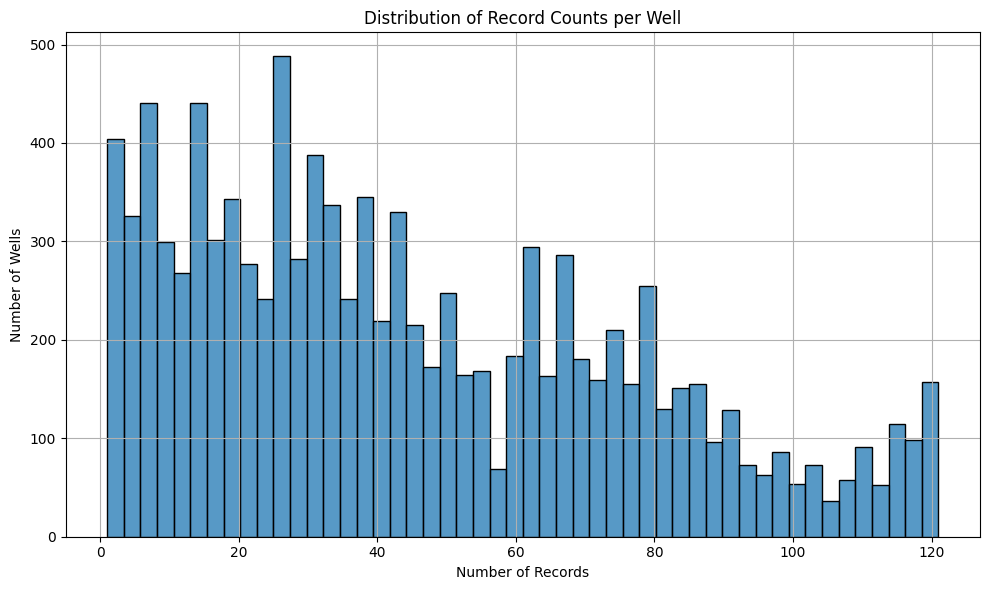

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count records per well
record_counts = production_df['WellID'].value_counts()

# Plot histogram
plt.figure(figsize=(10, 6))
sns.histplot(record_counts, bins=50, kde=False)
plt.title('Distribution of Record Counts per Well')
plt.xlabel('Number of Records')
plt.ylabel('Number of Wells')
plt.grid(True)
plt.tight_layout()
plt.show()

## 📊 Step 6: Summary Statistics for Numeric Features
We'll display summary statistics for all numeric columns.

In [ ]:
# Summary stats for numeric columns
production_df.describe()

,WellID,CompletionID,Unformatted_API_UWI,WellboreId,TotalProdMonths,TotalCompletionMonths,ProducingDays,Prod_BOE,Prod_MCFE,LiquidsProd_BBL,...,InjectionWater_BBL,InjectionOther_BBL,CalendarDayInjectionWater_BBLPerDAY,CalendarDayInjectionSteam_BBLPerDAY,CalendarDayInjectionSolvent_BBLPerDAY,CalendarDayInjectionGas_MCFPerDAY,CalendarDayInjectionOther_BBLPerDAY,ENVProdID,OilProd_BBL,CDOil_BBLPerDAY
count,4.722660e+05,4.722660e+05,4.722660e+05,4.722660e+05,472266.000000,472266.000000,472266.000000,472266.000000,4.722660e+05,472266.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,472266.0,472266.000000,472266.000000
mean,8.403000e+14,8.403010e+14,3.002118e+09,4.875747e+06,34.025634,33.992127,27.783459,11026.386454,6.615784e+04,6804.810204,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,-12045.315983,-395.282540
std,4.887193e+06,2.289029e+06,4.947457e+05,2.041545e+06,26.153472,26.146273,6.734129,13365.269118,8.019160e+04,9263.179864,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,19887.245294,652.091548
min,8.403000e+14,8.403010e+14,3.001538e+09,6.766200e+05,1.000000,1.000000,0.000000,0.000000,0.000000e+00,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,-868278.000000,-28009.000000
25%,8.403000e+14,8.403010e+14,3.001545e+09,3.239604e+06,13.000000,13.000000,29.000000,2999.000000,1.799100e+04,1553.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,-15120.750000,-497.000000
50%,8.403000e+14,8.403010e+14,3.002542e+09,5.811370e+06,28.000000,28.000000,30.000000,6708.000000,4.024650e+04,3685.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,-5845.000000,-192.000000
75%,8.403000e+14,8.403010e+14,3.002546e+09,6.247790e+06,50.000000,50.000000,31.000000,13726.000000,8.235400e+04,8087.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,-1535.000000,-50.000000
max,8.403000e+14,8.403010e+14,3.002593e+09,7.435656e+06,121.000000,121.000000,31.000000,262023.000000,1.572137e+06,249990.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,123896.000000,4130.000000


## 🕒 Step 7: Time Series Plot for a Sample Well
We will visualize production trends over time for one example well.

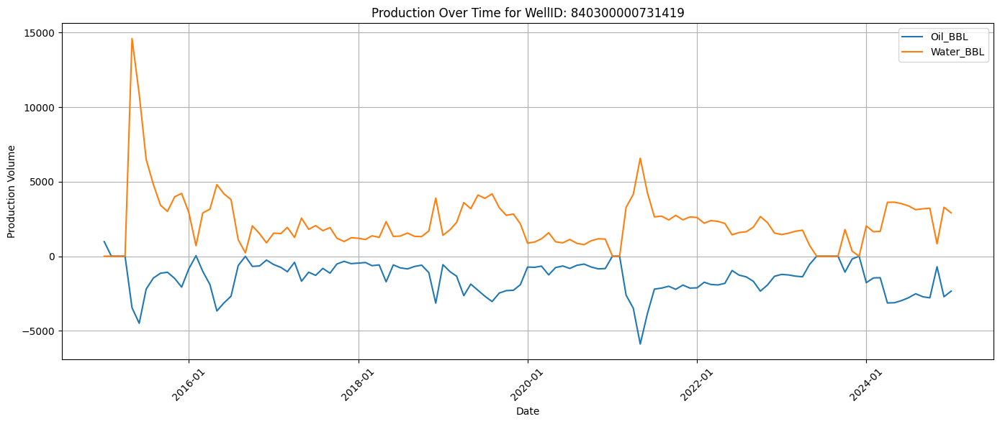

In [ ]:
import matplotlib.dates as mdates

# Convert Date column to datetime format
production_df['ProducingMonth'] = pd.to_datetime(production_df['ProducingMonth'], errors='coerce')

# Choose a sample WellID with sufficient records
sample_id = production_df['WellID'].value_counts().index[0]
sample_df = production_df[production_df['WellID'] == sample_id].sort_values(by='ProducingMonth')

# Plot the time series
plt.figure(figsize=(14, 6))
if 'OilProd_BBL' in sample_df.columns:
    plt.plot(sample_df['ProducingMonth'], sample_df['OilProd_BBL'], label='Oil_BBL')
if 'Gas_MCF' in sample_df.columns:
    plt.plot(sample_df['ProducingMonth'], sample_df['Gas_MCF'], label='Gas_MCF')
if 'WaterProd_BBL' in sample_df.columns:
    plt.plot(sample_df['ProducingMonth'], sample_df['WaterProd_BBL'], label='Water_BBL')

plt.title(f'Production Over Time for WellID: {sample_id}')
plt.xlabel('Date')
plt.ylabel('Production Volume')
plt.legend()
plt.grid(True)

# 📅 Use date formatters and locators to fix x-axis
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# Rotate and format
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


What Are PCA 1 and PCA 2?
PCA 1 (Principal Component 1):
The direction (linear combination of original variables) that explains the largest amount of variance in your dataset. Think of it as the most "important" axis that summarizes the main difference between wells in terms of production.

PCA 2 (Principal Component 2):
The second most important direction — orthogonal (perpendicular) to PCA 1 — that explains the next most significant variance in the data.

Together, PCA 1 and PCA 2 allow you to:

Compress the 3D space of [OilProd_BBL, Gas_MCF, WaterProd_BBL] into 2D
Retain as much information as possible for clustering visualization
Plot wells in a way where proximity reflects similar production behavior

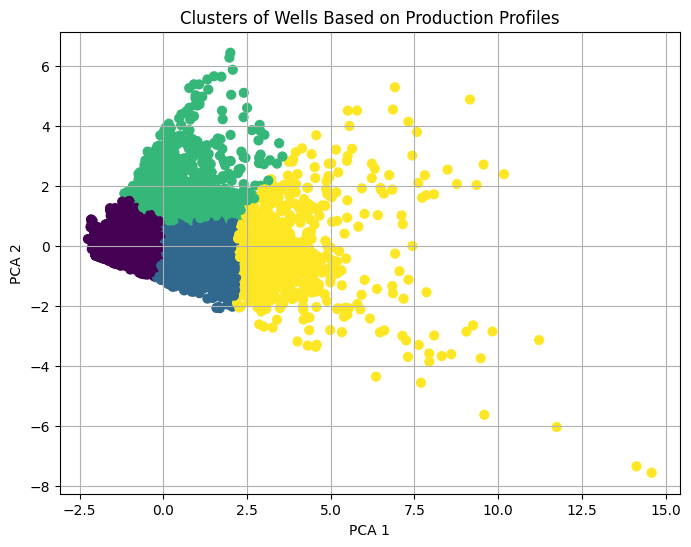

In [ ]:
# 🧪 Clustering Wells Based on Production Totals

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Aggregate cumulative production per well
agg_df = production_df.groupby('WellID')[['OilProd_BBL', 'GasProd_MCF', 'WaterProd_BBL']].sum().dropna()

# Normalize features
scaler = StandardScaler()
scaled = scaler.fit_transform(agg_df)

# Reduce dimensions for plotting
pca = PCA(n_components=2)
proj = pca.fit_transform(scaled)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=4, random_state=0)
labels = kmeans.fit_predict(scaled)

# Plot results
plt.figure(figsize=(8, 6))
plt.scatter(proj[:, 0], proj[:, 1], c=labels, cmap='viridis', s=40)
plt.title('Clusters of Wells Based on Production Profiles')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.grid(True)
plt.show()


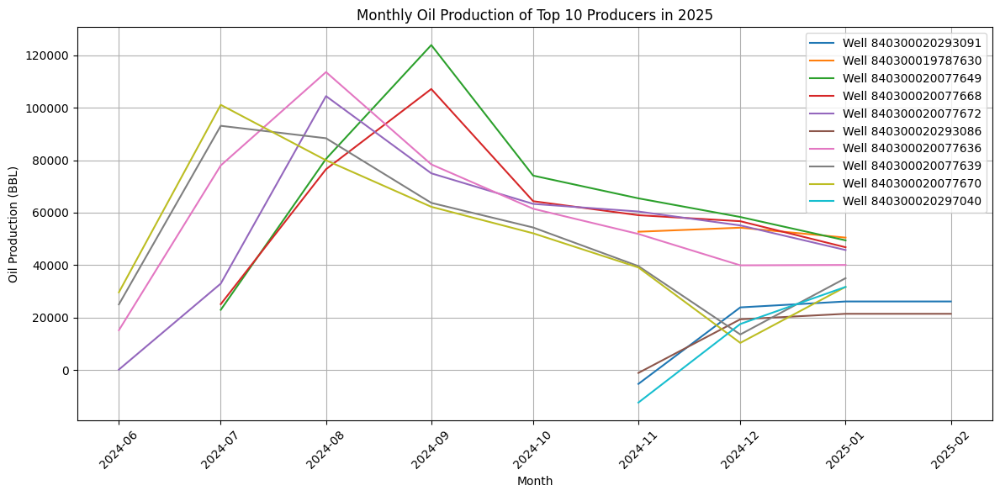

In [ ]:
# 🏆 Top 10 Oil Producers Over Time (Latest Year)

production_df['ProducingMonth'] = pd.to_datetime(production_df['ProducingMonth'], errors='coerce')
production_df['Year'] = production_df['ProducingMonth'].dt.year

# Aggregate oil production by well and year
yearly_oil = production_df.groupby(['Year', 'WellID'])['OilProd_BBL'].sum().reset_index()

# Find top 10 wells for the most recent year
latest_year = yearly_oil['Year'].max()
top10_wells = yearly_oil[yearly_oil['Year'] == latest_year].nlargest(10, 'OilProd_BBL')['WellID'].tolist()

# Group by month for those top wells
production_df['Month'] = production_df['ProducingMonth'].dt.to_period('M').dt.to_timestamp()
monthly_grouped = production_df[production_df['WellID'].isin(top10_wells)]
monthly_data = monthly_grouped.groupby(['Month', 'WellID'])['OilProd_BBL'].sum().reset_index()

# Plot
plt.figure(figsize=(12, 6))
for well_id in top10_wells:
    df = monthly_data[monthly_data['WellID'] == well_id]
    plt.plot(df['Month'], df['OilProd_BBL'], label=f'Well {well_id}')

plt.title(f'Monthly Oil Production of Top 10 Producers in {latest_year}')
plt.xlabel('Month')
plt.ylabel('Oil Production (BBL)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


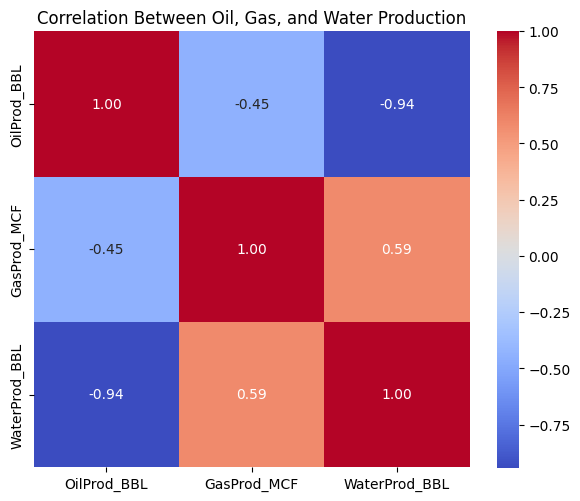

In [ ]:
# 🔁 Correlation Matrix for Oil, Gas, Water Production

import seaborn as sns

# Compute correlation
corr_matrix = production_df[['OilProd_BBL', 'GasProd_MCF', 'WaterProd_BBL']].corr()

# Heatmap visualization
plt.figure(figsize=(6, 5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title('Correlation Between Oil, Gas, and Water Production')
plt.tight_layout()
plt.show()


In [ ]:
# 🔎 Identify entries with negative OilProd_BBL
neg_oil = production_df[production_df['OilProd_BBL'] < 0]

# 🛠️ Display the date, WellID, and offending values
neg_oil_subset = neg_oil[['ProducingMonth', 'WellID', 'LiquidsProd_BBL', 'WaterProd_BBL', 'OilProd_BBL']]
print(f"Found {len(neg_oil_subset)} rows with negative OilProd_BBL.")
neg_oil_subset.sort_values(by='OilProd_BBL')


Found 412796 rows with negative OilProd_BBL.


,ProducingMonth,WellID,LiquidsProd_BBL,WaterProd_BBL,OilProd_BBL
472245,2024-07-01,840300020074325,0,868278,-868278
298318,2024-07-01,840300020074332,0,868254,-868254
101838,2024-07-01,840300020074328,49,868257,-868208
140602,2024-07-01,840300020074322,1246,868272,-867026
178475,2024-07-01,840300019810371,1445,868282,-866837
...,...,...,...,...,...
377088,2024-05-01,840300003230019,0,1,-1
451959,2020-04-01,840300005288488,3,4,-1
217982,2020-07-01,840300004682327,0,1,-1
13866,2024-12-01,840300005361550,0,1,-1


In [ ]:


# Upload the CSV file
uploaded = files.upload()

Saving env_csv-Wells-d7220_2025-03-18.csv to env_csv-Wells-d7220_2025-03-18.csv


In [ ]:
# 📥 Load the well dataset (contains Latitude and Longitude)
well_df = pd.read_csv("env_csv-Wells-d7220_2025-03-18.csv")

# ✅ Check for WellID and coordinates
print("Well dataset loaded with shape:", well_df.shape)
print("Sample columns:", well_df.columns.tolist())

# 📎 Merge with production time series to align coordinates
merged_df = pd.merge(production_df, well_df[['WellID', 'Latitude', 'Longitude']], on='WellID', how='left')

# 🔍 Drop rows where lat/lon is missing
merged_df = merged_df.dropna(subset=['Latitude', 'Longitude'])

# 🧮 Optional: Confirm how many wells have matched coordinates
print("Merged dataset shape:", merged_df.shape)


<ipython-input-14-5a8f70839d8f>:2: DtypeWarning: Columns (64,104) have mixed types. Specify dtype option on import or set low_memory=False.
  well_df = pd.read_csv("env_csv-Wells-d7220_2025-03-18.csv")


Well dataset loaded with shape: (10714, 519)
Sample columns: ['API_UWI', 'Unformatted_API_UWI', 'API_UWI_12', 'Unformatted_API_UWI_12', 'API_UWI_14', 'Unformatted_API_UWI_14', 'WellID', 'CompletionID', 'WellPadID', 'WellPadDirection', 'ENVWellGrouping', 'CompletionNumber', 'WellName', 'Country', 'StateProvince', 'County', 'Lease', 'LeaseName', 'ENVOperator', 'RawOperator', 'InitialOperator', 'ENVTicker', 'ENV_Peer_Group', 'ENVCompanyType', 'ENV_Stock_Exchange', 'ENVWellServiceProvider', 'ENVProdWellType', 'StateWellType', 'ENVWellType', 'ENVProducingMethod', 'ENVRegion', 'ENVBasin', 'ENVPlay', 'ENVSubPlay', 'ENVInterval', 'ENVIntervalSource', 'ENVSpacingAssumption', 'ENVWellStatus', 'ENVWellboreStatus', 'OnConfidential', 'OffConfidentialDate', 'Trajectory', 'ENVWellboreType', 'Formation', 'FirstProdDate', 'Latitude', 'Longitude', 'Latitude_BH', 'Longitude_BH', 'TVD_FT', 'MD_FT', 'District', 'Field', 'Survey', 'Block', 'Abstract', 'Platform', 'Section', 'Township', 'Range', 'Section_Tow

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import seaborn as sns

# 🧹 Convert to datetime and extract 'Year-Month'
merged_df['ProducingMonth'] = pd.to_datetime(merged_df['ProducingMonth'], errors='coerce')
merged_df['YearMonth'] = merged_df['ProducingMonth'].dt.to_period('M').astype(str)

# ✅ List of months in order
all_months = sorted(merged_df['YearMonth'].unique())

# 📦 Define target variable
heatmap_var = 'OilProd_BBL'  # Change this to 'WaterProd_BBL', 'Gas_MCF', etc. as needed


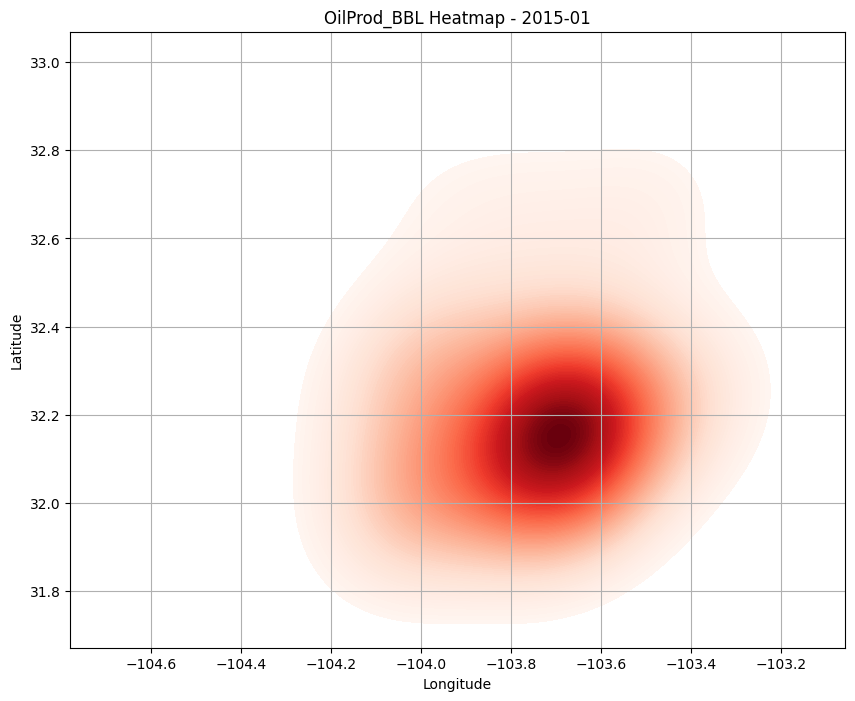

In [ ]:

# 🎬 Animated heatmap using KDE for each month (negative weights filtered)
fig, ax = plt.subplots(figsize=(10, 8))

def draw_heatmap(month):
    ax.clear()
    monthly_data = merged_df[merged_df['YearMonth'] == month]

    # ⛔ Clip any negative weights to zero
    monthly_data = monthly_data.copy()
    monthly_data[heatmap_var] = monthly_data[heatmap_var].clip(lower=0)

    if not monthly_data.empty:
        sns.kdeplot(
            x=monthly_data['Longitude'],
            y=monthly_data['Latitude'],
            weights=monthly_data[heatmap_var],
            cmap='Reds',
            fill=True,
            thresh=0.05,
            levels=100,
            ax=ax
        )
        ax.set_title(f"{heatmap_var} Heatmap - {month}")
    else:
        ax.set_title(f"No data for {month}")

    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.grid(True)

# 🎥 Create the animation
from matplotlib.animation import FuncAnimation
anim = FuncAnimation(fig, draw_heatmap, frames=all_months, repeat=False)

# 💡 Display in Jupyter/Colab
from IPython.display import HTML
HTML(anim.to_jshtml())

